### Streamlined Roboflow Inference Workflow

In [ ]:
# Ensure all necessary libraries are installed for Roboflow inference
!pip install inference[transformers]
!pip install ultralytics
!pip install supervision
!pip install roboflow
!pip install --upgrade opencv-contrib-python

import os
from google.colab import drive
import cv2
import supervision as sv
from roboflow import Roboflow
from inference import get_model

  Using cached opencv_contrib_python-4.13.0.92-cp37-abi3-manylinux_2_28_x86_64.whl.metadata (19 kB)
Using cached opencv_contrib_python-4.13.0.92-cp37-abi3-manylinux_2_28_x86_64.whl (79.2 MB)
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.10.0.84
    Uninstalling opencv-contrib-python-4.10.0.84:
      Successfully uninstalled opencv-contrib-python-4.10.0.84
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference 1.2.3 requires opencv-contrib-python<=4.10.0.84,>=4.8.1.78, but you have opencv-contrib-python 4.13.0.92 which is incompatible.


Your `inference` configuration does not support SAM3 model. Install SAM3 dependencies and set CORE_MODEL_SAM3_ENABLED to True.
Your `inference` configuration does not support Gaze Detection model. Use pip install 'inference[gaze]' to install missing requirements.To suppress this warning, set CORE_MODEL_GAZE_ENABLED to False.
Importing from timm.models.layers is deprecated, please import via timm.layers


#### 1. Mount Drive and Roboflow Setup

Mount Google Drive to access video files and set up the Roboflow project for model access.

In [10]:


drive.mount('/content/drive')

drive_path = "/content/drive/MyDrive/Unstructured Group Folder/NFL 1st and Future - Impact Detection - Data/nfl-impact-detection (Unzipped Files)/train/"

# Roboflow credentials and project download
rf = Roboflow(api_key="YYrmkzwSLYTs1DUgRxed")
project = rf.workspace("tommys-workspace-vmucs").project("rishi-fohsb-fdsoi")
version = project.version(1)
dataset = version.download("yolov8")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
loading Roboflow workspace...
loading Roboflow project...


#### 2. Perform Roboflow Inference on a Single Frame and Visualize

This code will extract an early frame from a specified video, run the Roboflow-trained model to detect objects, and then visualize the detections with bounding boxes and labels.

Performing inference on frame 0 from 57583_000082_Sideline.mp4
Detected classes:
  Class Name: defense, Confidence: 0.91
  Class Name: defense, Confidence: 0.90
  Class Name: defense, Confidence: 0.90
  Class Name: skill, Confidence: 0.90
  Class Name: defense, Confidence: 0.90
  Class Name: defense, Confidence: 0.90
  Class Name: skill, Confidence: 0.90
  Class Name: oline, Confidence: 0.90
  Class Name: defense, Confidence: 0.90
  Class Name: skill, Confidence: 0.89
  Class Name: oline, Confidence: 0.89
  Class Name: defense, Confidence: 0.89
  Class Name: oline, Confidence: 0.89
  Class Name: oline, Confidence: 0.89
  Class Name: skill, Confidence: 0.89
  Class Name: defense, Confidence: 0.88
  Class Name: defense, Confidence: 0.87
  Class Name: ref, Confidence: 0.86
  Class Name: qb, Confidence: 0.84
  Class Name: defense, Confidence: 0.84
  Class Name: skill, Confidence: 0.83
  Class Name: oline, Confidence: 0.79
  Class Name: defense, Confidence: 0.77


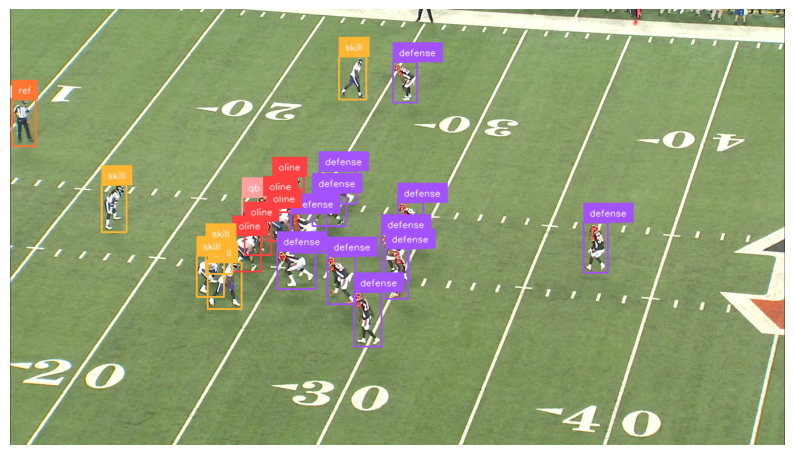

Found 23 detections in frame 0.


In [ ]:
# Specify the video path for inference
video_to_analyze = "57583_000082_Sideline.mp4" # Example video
video_path_full = os.path.join(drive_path, video_to_analyze)

# Load the Roboflow model (moved outside if/else for global availability)
model = get_model(
    model_id="rishi-fohsb-fdsoi/1",
    api_key=rf.api_key
)

# Extract an early frame from the video
cap = cv2.VideoCapture(video_path_full)
if not cap.isOpened():
    print(f"Error: Could not open video file {video_path_full}")
else:
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    early_frame_index = int(total_frames * 0.001) # 5% into the video

    cap.set(cv2.CAP_PROP_POS_FRAMES, early_frame_index)
    ret, image = cap.read()
    cap.release()

    if not ret:
        print("Could not read frame from video.")
    else:
        print(f"Performing inference on frame {early_frame_index} from {video_to_analyze}")

        # Perform inference
        results = model.infer(image)[0]
        detections = sv.Detections.from_inference(results)

        # Print detected class names for verification
        print("Detected classes:")
        for pred in results.predictions:
            print(f"  Class Name: {pred.class_name}, Confidence: {pred.confidence:.2f}")

        # Annotate image with detections
        bounding_box_annotator = sv.BoxAnnotator()
        label_annotator = sv.LabelAnnotator()

        annotated_image = bounding_box_annotator.annotate(
            scene=image.copy(), detections=detections
        )
        annotated_image = label_annotator.annotate(
            scene=annotated_image, detections=detections
        )

        # Display the annotated image
        sv.plot_image(annotated_image, size=(10,10))
        print(f"Found {len(detections)} detections in frame {early_frame_index}.")

### CHECK WHEN QB GOES OFF THE FRAME

###OLD MODEL (TRACKERMIL)

In [ ]:
import cv2
import supervision as sv

video_path_sideline = drive_path + "57995_000109_Sideline.mp4"
output_path = "/content/qb_followed.mp4"

def create_mil_tracker():
    for creator in [
        lambda: cv2.TrackerMIL.create() if hasattr(cv2, "TrackerMIL") else None,
        lambda: cv2.TrackerMIL_create() if hasattr(cv2, "TrackerMIL_create") else None,
        lambda: cv2.legacy.TrackerMIL.create() if hasattr(cv2, "legacy") and hasattr(cv2.legacy, "TrackerMIL") else None,
    ]:
        try:
            tracker = creator()
            if tracker is not None:
                return tracker
        except:
            pass
    raise AttributeError("No suitable TrackerMIL found.")

def find_qb_bbox(results, qb_class_name="qb", min_conf=0.5):
    candidates = [
        p for p in results.predictions
        if p.class_name.lower() == qb_class_name.lower() and p.confidence >= min_conf
    ]
    if not candidates:
        return None

    best_qb = max(candidates, key=lambda p: p.confidence)
    x1 = int(best_qb.x - best_qb.width / 2)
    y1 = int(best_qb.y - best_qb.height / 2)
    w = int(best_qb.width)
    h = int(best_qb.height)
    return (x1, y1, w, h)

cap = cv2.VideoCapture(video_path_sideline)
out = None

try:
    if not cap.isOpened():
        raise ValueError("Could not open video file.")

    ret, first_frame = cap.read()
    if not ret:
        raise ValueError("Could not read first frame.")

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    results = model.infer(first_frame)[0]
    qb_bbox = find_qb_bbox(results, qb_class_name="qb", min_conf=0.5)

    if qb_bbox is None:
        raise ValueError("Could not identify QB on first frame.")

    tracker = create_mil_tracker()
    tracker.init(first_frame, qb_bbox)

    out = cv2.VideoWriter(
        output_path,
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps,
        (width, height)
    )

    frame = first_frame.copy()
    x, y, w, h = qb_bbox
    cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 3)
    cv2.putText(frame, "QB", (x, max(25, y - 10)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    out.write(frame)

    lost_count = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        success, bbox = tracker.update(frame)

        if success:
            lost_count = 0
            x, y, w, h = [int(v) for v in bbox]
            cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 3)
            cv2.putText(frame, "QB", (x, max(25, y - 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
        else:
            lost_count += 1
            cv2.putText(frame, "Tracking lost", (50, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

        out.write(frame)

    print("Saved to:", output_path)

finally:
    cap.release()
    if out is not None:
        out.release()

Saved to: /content/qb_followed.mp4


# NEW MODEL (TRACKERCSRT)

In [ ]:
import cv2
from inference import get_model
from roboflow import Roboflow

video_path = drive_path + "57995_000109_Sideline.mp4"
output_path = "/content/qb_followed.mp4"

rf = Roboflow(api_key=key)
model = get_model(
    model_id="rishi-fohsb-fdsoi/1",
    api_key=rf.api_key
)

def create_tracker():
    try:
        return cv2.legacy.TrackerCSRT_create()
    except:
        try:
            return cv2.TrackerCSRT_create()
        except:
            return cv2.TrackerCSRT.create()

def find_qb_bbox(results, qb_class_name="qb", min_conf=0.5):
    candidates = [
        p for p in results.predictions
        if p.class_name.lower() == qb_class_name.lower()
        and p.confidence >= min_conf
    ]
    if not candidates:
        return None

    best = max(candidates, key=lambda p: p.confidence)
    x = int(best.x - best.width / 2)
    y = int(best.y - best.height / 2)
    w = int(best.width)
    h = int(best.height)
    return (x, y, w, h)

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error opening video")
else:
    ret, first_frame = cap.read()

    if not ret:
        print("Could not read first frame")
    else:
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        fps = cap.get(cv2.CAP_PROP_FPS)

        results = model.infer(first_frame)[0]
        qb_bbox = find_qb_bbox(results)

        if qb_bbox is None:
            print("No QB detected on first frame")
        else:
            tracker = create_tracker()
            tracker.init(first_frame, qb_bbox)

            out = cv2.VideoWriter(
                output_path,
                cv2.VideoWriter_fourcc(*"mp4v"),
                fps,
                (width, height)
            )

            # write first frame
            x, y, w, h = qb_bbox
            first_out = first_frame.copy()
            cv2.rectangle(first_out, (x, y), (x + w, y + h), (255, 0, 0), 3)
            cv2.putText(first_out, "QB", (x, max(25, y - 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
            out.write(first_out)

            while True:
                ret, frame = cap.read()
                if not ret:
                    break

                success, bbox = tracker.update(frame)

                if success:
                    x, y, w, h = [int(v) for v in bbox]
                    cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 3)
                    cv2.putText(frame, "QB", (x, max(25, y - 10)),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
                else:
                    cv2.putText(frame, "Tracking lost", (50, 50),
                                cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

                out.write(frame)

            cap.release()
            out.release()
            print("Saved to:", output_path)

Saved to: /content/qb_followed.mp4


In [13]:
import cv2
from inference import get_model
from roboflow import Roboflow

video_path = drive_path + "57597_001242_Sideline.mp4"
output_path = "/content/qb_followed.mp4"

MIN_CONF = 0.6          # raise if locking onto wrong player
MAX_DETECTION_FRAMES = 90  # how many frames to scan before giving up
MIN_BBOX_AREA = 500     # reject tiny detections (noise)

rf = Roboflow(api_key="YYrmkzwSLYTs1DUgRxed")
model = get_model(model_id="rishi-fohsb-fdsoi/1", api_key=rf.api_key)

def create_tracker():
    try:
        return cv2.TrackerCSRT_create()
    except:
        return cv2.legacy.TrackerCSRT_create()

def find_qb_bbox(results, frame_shape, min_conf=MIN_CONF):
    h_frame, w_frame = frame_shape[:2]
    candidates = [
        p for p in results.predictions
        if p.class_name.lower() == "qb"
        and p.confidence >= min_conf
    ]
    if not candidates:
        return None

    best = max(candidates, key=lambda p: p.confidence)

    # Clamp to frame bounds
    x = max(0, int(best.x - best.width / 2))
    y = max(0, int(best.y - best.height / 2))
    w = min(int(best.width), w_frame - x)
    h = min(int(best.height), h_frame - y)

    # Reject if bbox is too small to be a real detection
    if w * h < MIN_BBOX_AREA:
        return None

    return (x, y, w, h)

cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error opening video")
else:
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    out = cv2.VideoWriter(
        output_path,
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps,
        (width, height)
    )

    qb_bbox = None
    tracker = None
    frame_count = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1

        # Phase 1: scan early frames until we get a confident detection
        if qb_bbox is None:
            if frame_count > MAX_DETECTION_FRAMES:
                print(f"No QB found in first {MAX_DETECTION_FRAMES} frames, stopping.")
                break

            results = model.infer(frame)[0]
            qb_bbox = find_qb_bbox(results, frame.shape)

            if qb_bbox:
                tracker = create_tracker()
                tracker.init(frame, qb_bbox)
                print(f"QB locked on frame {frame_count} — bbox: {qb_bbox}")
                x, y, w, h = qb_bbox
                cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 3)
                cv2.putText(frame, f"QB (locked f{frame_count})", (x, max(25, y - 10)),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
            else:
                cv2.putText(frame, f"Searching... ({frame_count}/{MAX_DETECTION_FRAMES})",
                            (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 255, 255), 2)

            out.write(frame)
            continue

        # Phase 2: pure tracking, no re-inference
        success, bbox = tracker.update(frame)

        if success:
            x, y, w, h = [int(v) for v in bbox]
            cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 3)
            cv2.putText(frame, "QB", (x, max(25, y - 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
        else:
            cv2.putText(frame, "Tracking lost", (50, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

        out.write(frame)

    cap.release()
    out.release()
    print("Saved to:", output_path)

QB locked on frame 1 — bbox: (742, 314, 42, 62)
Saved to: /content/qb_followed.mp4


### ID TRACKING

Detected players:
  ID  0 — defense         conf: 0.89  bbox: (706, 320, 48, 60)
  ID  1 — defense         conf: 0.89  bbox: (758, 350, 45, 69)
  ID  2 — defense         conf: 0.89  bbox: (155, 317, 35, 85)
  ID  3 — defense         conf: 0.88  bbox: (253, 255, 43, 67)
  ID  4 — ref             conf: 0.88  bbox: (977, 238, 34, 71)
  ID  5 — oline           conf: 0.88  bbox: (849, 339, 47, 52)
  ID  6 — defense         conf: 0.87  bbox: (618, 320, 47, 75)
  ID  7 — defense         conf: 0.87  bbox: (610, 301, 58, 55)
  ID  8 — defense         conf: 0.87  bbox: (982, 365, 45, 85)
  ID  9 — oline           conf: 0.85  bbox: (923, 358, 47, 54)
  ID 10 — defense         conf: 0.84  bbox: (881, 370, 62, 55)
  ID 11 — skill           conf: 0.81  bbox: (997, 301, 39, 63)
  ID 12 — oline           conf: 0.66  bbox: (891, 347, 44, 45)
  ID 13 — defense         conf: 0.65  bbox: (1058, 329, 33, 87)
  ID 14 — defense         conf: 0.54  bbox: (803, 351, 49, 57)
  ID 15 — defense         conf: 0.50

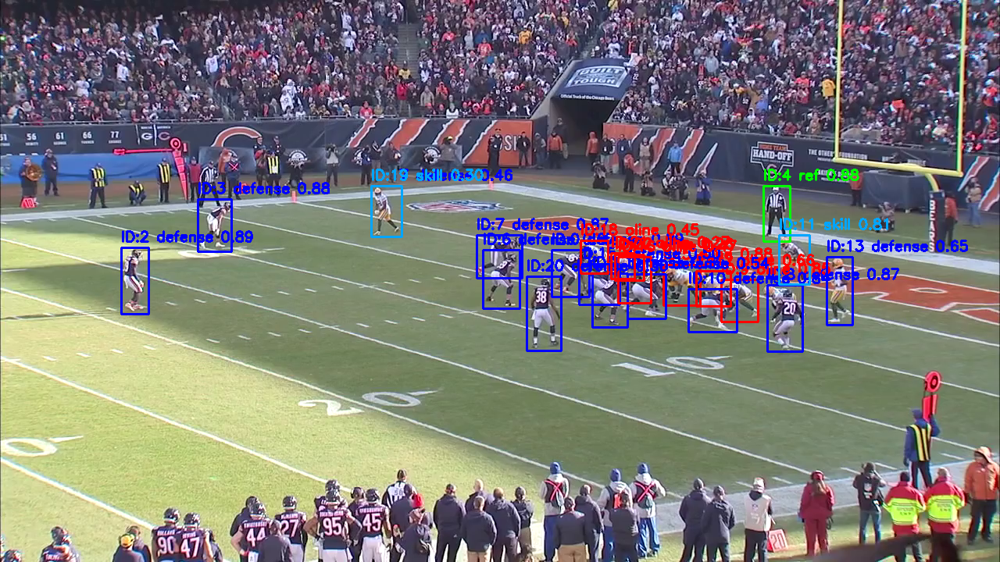

In [16]:
import cv2
import numpy as np
from inference import get_model
from roboflow import Roboflow
from google.colab.patches import cv2_imshow

rf = Roboflow(api_key="YYrmkzwSLYTs1DUgRxed")
model = get_model(model_id="rishi-fohsb-fdsoi/1", api_key=rf.api_key)

video_path = drive_path + "57781_000252_Sideline.mp4"

cap = cv2.VideoCapture(video_path)
ret, first_frame = cap.read()
cap.release()

results = model.infer(first_frame)[0]

# Assign an ID to every prediction
detections = []
for i, p in enumerate(results.predictions):
    x = max(0, int(p.x - p.width / 2))
    y = max(0, int(p.y - p.height / 2))
    w = int(p.width)
    h = int(p.height)
    detections.append({
        "id": i,
        "class": p.class_name,
        "conf": p.confidence,
        "bbox": (x, y, w, h)
    })

# Color per class
class_colors = {}
palette = [
    (255, 0, 0), (0, 255, 0), (0, 0, 255),
    (255, 165, 0), (128, 0, 128), (0, 255, 255)
]

display = first_frame.copy()
for det in detections:
    cls = det["class"]
    if cls not in class_colors:
        class_colors[cls] = palette[len(class_colors) % len(palette)]
    color = class_colors[cls]

    x, y, w, h = det["bbox"]
    cv2.rectangle(display, (x, y), (x + w, y + h), color, 2)
    label = f"ID:{det['id']} {cls} {det['conf']:.2f}"
    cv2.putText(display, label, (x, max(20, y - 8)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Print summary so you know what to pick
print("Detected players:")
for det in detections:
    print(f"  ID {det['id']:2d} — {det['class']:15s} conf: {det['conf']:.2f}  bbox: {det['bbox']}")

cv2_imshow(display)

In [17]:
import os
import shutil
import subprocess
from IPython.display import Video, display

# ---- SET THIS ----
TARGET_ID = 2   # change to whichever ID you want to track
# ------------------

target = next((d for d in detections if d["id"] == TARGET_ID), None)

if target is None:
    print(f"ID {TARGET_ID} not found. Pick from: {[d['id'] for d in detections]}")
else:
    print(f"Tracking: ID {TARGET_ID} — {target['class']} (conf: {target['conf']:.2f})")

    raw_output_path = "/content/id_followed_raw.mp4"
    output_path = "/content/id_followed.mp4"

    def create_tracker():
        try:
            return cv2.TrackerCSRT_create()
        except:
            return cv2.legacy.TrackerCSRT_create()

    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    tracker = create_tracker()
    ret, first_frame = cap.read()
    tracker.init(first_frame, target["bbox"])

    out = cv2.VideoWriter(
        raw_output_path,
        cv2.VideoWriter_fourcc(*"mp4v"),
        fps,
        (width, height)
    )

    # Draw first frame
    x, y, w, h = target["bbox"]
    color = class_colors.get(target["class"], (255, 0, 0))
    first_out = first_frame.copy()
    cv2.rectangle(first_out, (x, y), (x + w, y + h), color, 3)
    cv2.putText(first_out, f"ID:{TARGET_ID} {target['class']}", (x, max(25, y - 10)),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
    out.write(first_out)

    # Draw all other detections dimmed on first frame too (optional context)
    frame_count = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        frame_count += 1
        success, bbox = tracker.update(frame)

        if success:
            x, y, w, h = [int(v) for v in bbox]
            cv2.rectangle(frame, (x, y), (x + w, y + h), color, 3)
            cv2.putText(frame, f"ID:{TARGET_ID} {target['class']}", (x, max(25, y - 10)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
        else:
            cv2.putText(frame, "Tracking lost", (50, 50),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)

        out.write(frame)

    cap.release()
    out.release()
    if shutil.which("ffmpeg"):
        subprocess.run([
            "ffmpeg", "-y", "-i", raw_output_path,
            "-vcodec", "libx264", "-pix_fmt", "yuv420p",
            "-movflags", "+faststart", "-an", output_path,
        ], check=False, capture_output=True)
    else:
        output_path = raw_output_path

    print(f"Done — {frame_count} frames written to {output_path}")
    display(Video(output_path, embed=True, width=900))

Tracking: ID 2 — defense (conf: 0.89)
Done — 501 frames written to /content/id_followed.mp4


###Tracking Work

No snap detected — try lowering SNAP_SPEED or QUIET_WINDOW

── Play Summary ──────────────────────────────
Snap at:            0.00s (frame 0)
Time to move:       3.84s after snap
Max speed:          324.2 px/s
Avg speed (post):   95.8 px/s
Max acceleration:   3.6 px/frame²
Total displacement: 354.9 px
Primary direction:  Right (toward sideline)


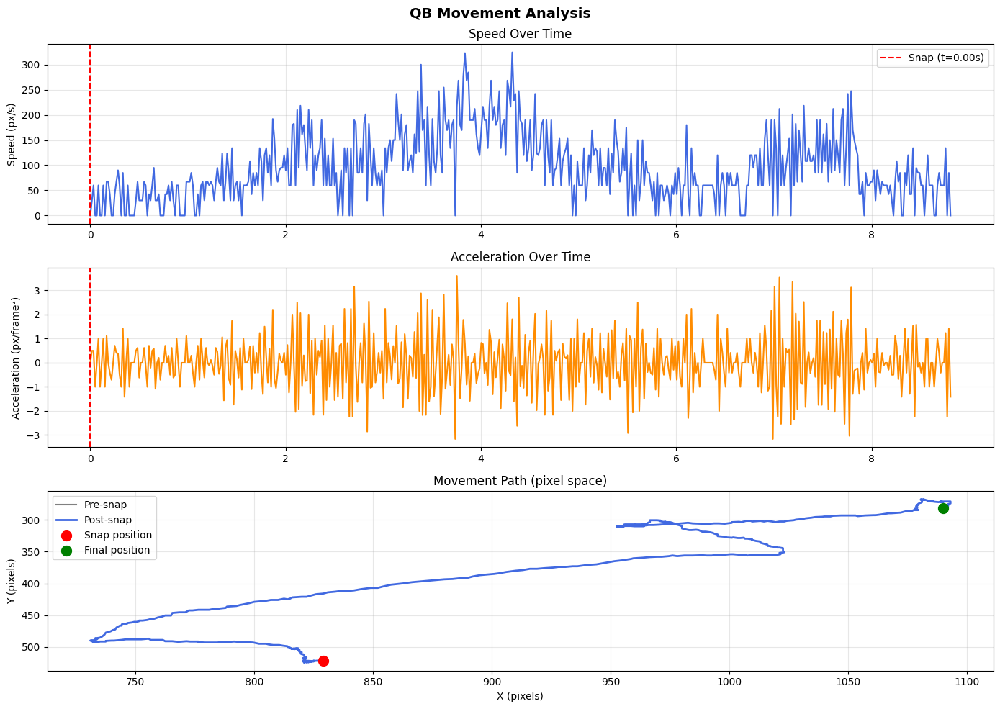

Plot saved to /content/qb_analysis.png


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the CSV
df = pd.read_csv("/content/tracking_data.csv")

# Clean up numpy type artifacts
for col in ["speed_px_per_frame", "speed_px_per_sec", "direction_deg", "acceleration"]:
    df[col] = pd.to_numeric(df[col], errors="coerce")

# ── 1. Detect the snap ───────────────────────────────────────────
# Snap = first frame where speed jumps above threshold after a quiet period
QUIET_SPEED = 5       # px/frame — "standing still"
SNAP_SPEED  = 15      # px/frame — "snap happened"
QUIET_WINDOW = 10     # frames of quiet before we start looking for snap

snap_frame = None
quiet_count = 0

for i, row in df.iterrows():
    spd = row["speed_px_per_frame"]
    if pd.isna(spd):
        continue
    if spd < QUIET_SPEED:
        quiet_count += 1
    elif quiet_count >= QUIET_WINDOW and spd > SNAP_SPEED:
        snap_frame = row["frame"]
        snap_time  = row["time_sec"]
        break

if snap_frame:
    print(f"Snap detected at frame {snap_frame} ({snap_time:.2f}s)")
else:
    print("No snap detected — try lowering SNAP_SPEED or QUIET_WINDOW")
    snap_frame = 0
    snap_time  = 0.0

# ── 2. Split pre/post snap ───────────────────────────────────────
pre_snap  = df[df["frame"] <  snap_frame]
post_snap = df[df["frame"] >= snap_frame]

# ── 3. Core metrics ──────────────────────────────────────────────
post_tracking = post_snap[post_snap["status"] == "tracking"]

max_speed      = post_tracking["speed_px_per_sec"].max()
avg_speed      = post_tracking["speed_px_per_sec"].mean()
max_accel      = post_tracking["acceleration"].max()

# Displacement from snap position to final position
snap_row = df[df["frame"] == snap_frame]
if not snap_row.empty and not post_tracking.empty:
    sx = snap_row.iloc[0]["center_x"]
    sy = snap_row.iloc[0]["center_y"]
    ex = post_tracking.iloc[-1]["center_x"]
    ey = post_tracking.iloc[-1]["center_y"]
    total_displacement_px = np.sqrt((ex - sx)**2 + (ey - sy)**2)

    # Direction of movement from snap
    move_angle = np.degrees(np.arctan2(-(ey - sy), ex - sx))

    if   -45  <= move_angle <= 45:   move_dir = "Right (toward sideline)"
    elif  135 <= abs(move_angle):    move_dir = "Left (toward sideline)"
    elif move_angle > 45:            move_dir = "Backward (drop back)"
    else:                            move_dir = "Forward (scramble/rush)"
else:
    total_displacement_px = 0
    move_dir = "Unknown"

# Time to first movement after snap
first_move = post_tracking[post_tracking["speed_px_per_frame"] > QUIET_SPEED]
time_to_move = (first_move.iloc[0]["time_sec"] - snap_time) if not first_move.empty else None

print(f"\n── Play Summary ──────────────────────────────")
print(f"Snap at:            {snap_time:.2f}s (frame {snap_frame})")
print(f"Time to move:       {time_to_move:.2f}s after snap" if time_to_move else "Time to move:       N/A")
print(f"Max speed:          {max_speed:.1f} px/s")
print(f"Avg speed (post):   {avg_speed:.1f} px/s")
print(f"Max acceleration:   {max_accel:.1f} px/frame²")
print(f"Total displacement: {total_displacement_px:.1f} px")
print(f"Primary direction:  {move_dir}")

# ── 4. Plots ─────────────────────────────────────────────────────
fig, axes = plt.subplots(3, 1, figsize=(14, 10))
fig.suptitle("QB Movement Analysis", fontsize=14, fontweight="bold")

# Speed over time
axes[0].plot(df["time_sec"], df["speed_px_per_sec"], color="royalblue", linewidth=1.5)
axes[0].axvline(snap_time, color="red", linestyle="--", label=f"Snap (t={snap_time:.2f}s)")
axes[0].set_ylabel("Speed (px/s)")
axes[0].set_title("Speed Over Time")
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Acceleration
axes[1].plot(df["time_sec"], df["acceleration"], color="darkorange", linewidth=1.5)
axes[1].axvline(snap_time, color="red", linestyle="--")
axes[1].axhline(0, color="gray", linewidth=0.8)
axes[1].set_ylabel("Acceleration (px/frame²)")
axes[1].set_title("Acceleration Over Time")
axes[1].grid(True, alpha=0.3)

# Movement path (x,y trajectory)
tracking_only = df[df["status"] == "tracking"]
pre_t  = tracking_only[tracking_only["frame"] <  snap_frame]
post_t = tracking_only[tracking_only["frame"] >= snap_frame]

axes[2].plot(pre_t["center_x"],  pre_t["center_y"],  color="gray",      linewidth=1.5, label="Pre-snap")
axes[2].plot(post_t["center_x"], post_t["center_y"], color="royalblue", linewidth=2,   label="Post-snap")

if not snap_row.empty:
    axes[2].scatter([sx], [sy], color="red",   s=100, zorder=5, label="Snap position")
if not post_tracking.empty:
    axes[2].scatter([ex], [ey], color="green", s=100, zorder=5, label="Final position")

axes[2].set_xlabel("X (pixels)")
axes[2].set_ylabel("Y (pixels)")
axes[2].set_title("Movement Path (pixel space)")
axes[2].invert_yaxis()  # screen coords: y increases downward
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("/content/qb_analysis.png", dpi=150)
plt.show()
print("Plot saved to /content/qb_analysis.png")

### Video Paths

In [ ]:
base = "/content/drive/MyDrive/Unstructured Data Analytics/Unstructured Group Folder/NFL 1st and Future - Impact Detection - Data/nfl-impact-detection (Unzipped Files)/train"
for item in os.listdir(base):
    print(item)

57584_002674_Endzone.mp4
57584_000336_Endzone.mp4
58103_003494_Sideline.mp4
57904_001367_Endzone.mp4
57906_000718_Sideline.mp4
57906_000718_Endzone.mp4
58106_002918_Endzone.mp4
57905_002404_Endzone.mp4
57584_000336_Sideline.mp4
58098_001193_Endzone.mp4
58094_002819_Sideline.mp4
58104_000352_Sideline.mp4
57995_000109_Sideline.mp4
58103_003494_Endzone.mp4
58005_001612_Endzone.mp4
57992_000301_Endzone.mp4
58093_001923_Sideline.mp4
57911_002492_Sideline.mp4
58093_001923_Endzone.mp4
57998_002181_Sideline.mp4
58005_001254_Sideline.mp4
58000_001306_Sideline.mp4
58048_000086_Endzone.mp4
57911_002492_Endzone.mp4
58094_000423_Sideline.mp4
57997_003691_Sideline.mp4
57911_000147_Endzone.mp4
57912_001325_Sideline.mp4
58048_000086_Sideline.mp4
57992_000350_Sideline.mp4
57913_000218_Endzone.mp4
57993_000475_Sideline.mp4
57992_000301_Sideline.mp4
57915_003093_Sideline.mp4
57995_000109_Endzone.mp4
57910_001164_Endzone.mp4
57907_003615_Endzone.mp4
57910_001164_Sideline.mp4
57912_001325_Endzone.mp4
57907

### Test on Random Sideline Videos for QB Detection

In [ ]:
import random

# Get all sideline videos from the drive_path
all_video_files = os.listdir(drive_path)
sideline_videos = [f for f in all_video_files if 'Sideline.mp4' in f]

# Select 20 random sideline videos, or fewer if less than 20 are available
num_videos_to_test = min(30, len(sideline_videos))
random_sideline_videos = random.sample(sideline_videos, num_videos_to_test)

print(f"Testing {num_videos_to_test} random sideline videos...")

videos_with_qb_detection = []
qb_confidence_threshold = 0.5

for i, video_name in enumerate(random_sideline_videos):
    video_path_full = os.path.join(drive_path, video_name)

    cap = cv2.VideoCapture(video_path_full)
    if not cap.isOpened():
        print(f"Error: Could not open video file {video_path_full}. Skipping.")
        continue

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    # Extract a frame early in the video, e.g., 5% into the video
    early_frame_index = int(total_frames * 0.001)

    cap.set(cv2.CAP_PROP_POS_FRAMES, early_frame_index)
    ret, frame = cap.read()
    cap.release()

    if not ret:
        print(f"Could not read frame {early_frame_index} from {video_name}. Skipping.")
        continue

    # Perform inference
    results = model.infer(frame)[0]

    found_qb_in_video = False
    for pred in results.predictions:
        if pred.class_name.lower() == 'qb' and pred.confidence >= qb_confidence_threshold:
            found_qb_in_video = True
            videos_with_qb_detection.append((video_name, pred.confidence))
            break # Found a QB, move to the next video

    print(f"[{i+1}/{num_videos_to_test}] Processed {video_name}. QB detected: {found_qb_in_video}")

print(f"\n--- Summary ---")
print(f"Total videos tested: {num_videos_to_test}")
print(f"Videos with QB (confidence >= {qb_confidence_threshold}): {len(videos_with_qb_detection)}")
if videos_with_qb_detection:
    print("Videos and their highest QB confidence:")
    for video, conf in videos_with_qb_detection:
        print(f"  - {video}: {conf:.2f}")

accuracy = (len(videos_with_qb_detection) / num_videos_to_test) * 100 if num_videos_to_test > 0 else 0
print(f"QB Detection Accuracy: {accuracy:.2f}%")


Testing 30 random sideline videos...
[1/30] Processed 57790_002792_Sideline.mp4. QB detected: True
[2/30] Processed 57993_000475_Sideline.mp4. QB detected: True
[3/30] Processed 57912_001325_Sideline.mp4. QB detected: True
[4/30] Processed 57911_000147_Sideline.mp4. QB detected: True
[5/30] Processed 57583_000082_Sideline.mp4. QB detected: True
[6/30] Processed 57910_001164_Sideline.mp4. QB detected: True
[7/30] Processed 57790_002839_Sideline.mp4. QB detected: True
[8/30] Processed 57680_002206_Sideline.mp4. QB detected: True
[9/30] Processed 57682_002630_Sideline.mp4. QB detected: True
[10/30] Processed 58005_001612_Sideline.mp4. QB detected: True
[11/30] Processed 57778_004244_Sideline.mp4. QB detected: True
[12/30] Processed 57906_000718_Sideline.mp4. QB detected: True
[13/30] Processed 57781_000252_Sideline.mp4. QB detected: False
[14/30] Processed 57782_000600_Sideline.mp4. QB detected: False
[15/30] Processed 57992_000301_Sideline.mp4. QB detected: True
[16/30] Processed 57586_0

### QB Tracking With Sanity Checks

This version still uses Roboflow only to lock onto the QB before the play develops, then uses CSRT tracking after that. It flags the track as uncertain when the box jumps too far, changes size too aggressively, or drifts off frame.

In [ ]:
import os
import csv
import cv2
import math
import shutil
import subprocess
from IPython.display import Video, display
from inference import get_model
from roboflow import Roboflow

# Change this video name to test another sideline clip.
video_to_track = "57597_001242_Sideline.mp4"
video_path = os.path.join(drive_path, video_to_track)

raw_output_path = "/content/qb_sanity_checked_raw.mp4"
output_path = "/content/qb_sanity_checked.mp4"
csv_path = "/content/qb_sanity_checked_tracking_log.csv"

MIN_CONF = 0.6
MAX_DETECTION_FRAMES = 90
MIN_BBOX_AREA = 500
MAX_CENTER_JUMP_FRAC = 0.10
MAX_AREA_RATIO = 2.75
MIN_AREA_RATIO = 0.30
MAX_OFF_FRAME_FRAC = 0.25

try:
    model
except NameError:
    rf = Roboflow(api_key=key)
    model = get_model(model_id="rishi-fohsb-fdsoi/1", api_key=rf.api_key)

def create_tracker():
    try:
        return cv2.TrackerCSRT_create()
    except Exception:
        return cv2.legacy.TrackerCSRT_create()

def find_qb_bbox(results, frame_shape, min_conf=MIN_CONF):
    h_frame, w_frame = frame_shape[:2]
    candidates = [
        p for p in results.predictions
        if p.class_name.lower() == "qb" and p.confidence >= min_conf
    ]
    if not candidates:
        return None

    best = max(candidates, key=lambda p: p.confidence)
    x = max(0, int(best.x - best.width / 2))
    y = max(0, int(best.y - best.height / 2))
    w = min(int(best.width), w_frame - x)
    h = min(int(best.height), h_frame - y)

    if w * h < MIN_BBOX_AREA:
        return None
    return (x, y, w, h)

def bbox_center(bbox):
    x, y, w, h = bbox
    return (x + w / 2, y + h / 2)

def bbox_area(bbox):
    return max(1, bbox[2] * bbox[3])

def off_frame_fraction(bbox, frame_shape):
    frame_h, frame_w = frame_shape[:2]
    x, y, w, h = bbox
    x2 = x + w
    y2 = y + h
    inside_w = max(0, min(x2, frame_w) - max(x, 0))
    inside_h = max(0, min(y2, frame_h) - max(y, 0))
    inside_area = inside_w * inside_h
    return 1 - (inside_area / bbox_area(bbox))

def validate_bbox(bbox, prev_bbox, frame_shape):
    if bbox is None:
        return False, "tracker_failed"

    frame_h, frame_w = frame_shape[:2]
    diag = math.sqrt(frame_w ** 2 + frame_h ** 2)
    max_center_jump = max(80, diag * MAX_CENTER_JUMP_FRAC)

    center = bbox_center(bbox)
    prev_center = bbox_center(prev_bbox)
    center_jump = math.dist(center, prev_center)
    if center_jump > max_center_jump:
        return False, f"large_jump_{center_jump:.1f}px"

    area_ratio = bbox_area(bbox) / bbox_area(prev_bbox)
    if area_ratio > MAX_AREA_RATIO or area_ratio < MIN_AREA_RATIO:
        return False, f"area_ratio_{area_ratio:.2f}"

    off_frac = off_frame_fraction(bbox, frame_shape)
    if off_frac > MAX_OFF_FRAME_FRAC:
        return False, f"off_frame_{off_frac:.2f}"

    return True, "tracking"

def draw_status(frame, bbox, status, reason=None):
    if bbox is not None:
        x, y, w, h = [int(v) for v in bbox]
        color = (255, 0, 0) if status == "tracking" else (0, 0, 255)
        cv2.rectangle(frame, (x, y), (x + w, y + h), color, 3)
        label = "QB" if status == "tracking" else "QB uncertain"
        cv2.putText(frame, label, (x, max(25, y - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    if status != "tracking":
        message = "Tracking uncertain" if reason is None else f"Tracking uncertain: {reason}"
        cv2.putText(frame, message, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
    return frame

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    raise ValueError(f"Could not open video: {video_path}")

width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS) or 30
out = cv2.VideoWriter(raw_output_path, cv2.VideoWriter_fourcc(*"mp4v"), fps, (width, height))
if not out.isOpened():
    cap.release()
    raise ValueError("Could not create output video writer.")

tracker = None
prev_bbox = None
last_good_bbox = None
tracking_log = []
frame_count = 0
locked_frame = None

while True:
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    if tracker is None:
        if frame_count > MAX_DETECTION_FRAMES:
            draw_status(frame, None, "uncertain", f"no_qb_in_first_{MAX_DETECTION_FRAMES}_frames")
            out.write(frame)
            tracking_log.append({"frame": frame_count, "status": "not_locked", "reason": "no_qb_found"})
            continue

        results = model.infer(frame)[0]
        qb_bbox = find_qb_bbox(results, frame.shape)
        if qb_bbox is None:
            cv2.putText(frame, f"Searching for QB ({frame_count}/{MAX_DETECTION_FRAMES})", (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 255), 2)
            out.write(frame)
            tracking_log.append({"frame": frame_count, "status": "searching", "reason": "no_pre_snap_detection"})
            continue

        tracker = create_tracker()
        tracker.init(frame, qb_bbox)
        prev_bbox = qb_bbox
        last_good_bbox = qb_bbox
        locked_frame = frame_count
        draw_status(frame, qb_bbox, "tracking")
        cv2.putText(frame, f"QB locked on frame {frame_count}", (50, 85), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
        out.write(frame)
        tracking_log.append({"frame": frame_count, "status": "locked", "reason": "roboflow_pre_snap", "bbox": qb_bbox})
        continue

    success, tracked_bbox = tracker.update(frame)
    tracked_bbox = tuple(int(v) for v in tracked_bbox) if success else None
    is_valid, reason = validate_bbox(tracked_bbox, prev_bbox, frame.shape)

    if is_valid:
        prev_bbox = tracked_bbox
        last_good_bbox = tracked_bbox
        draw_status(frame, tracked_bbox, "tracking")
        tracking_log.append({"frame": frame_count, "status": "tracking", "reason": "ok", "bbox": tracked_bbox})
    else:
        draw_status(frame, last_good_bbox, "uncertain", reason)
        tracking_log.append({"frame": frame_count, "status": "uncertain", "reason": reason, "bbox": tracked_bbox})

    out.write(frame)

cap.release()
out.release()

with open(csv_path, "w", newline="") as f:
    fieldnames = ["frame", "status", "reason", "bbox"]
    writer = csv.DictWriter(f, fieldnames=fieldnames)
    writer.writeheader()
    writer.writerows(tracking_log)

if shutil.which("ffmpeg"):
    subprocess.run([
        "ffmpeg", "-y", "-i", raw_output_path,
        "-vcodec", "libx264", "-pix_fmt", "yuv420p",
        "-movflags", "+faststart", "-an", output_path,
    ], check=False, capture_output=True)
else:
    output_path = raw_output_path

print(f"QB locked on frame: {locked_frame}")
print(f"Frames processed: {frame_count}")
print(f"Video saved to: {output_path}")
print(f"Tracking log saved to: {csv_path}")

display(Video(output_path, embed=True, width=900))
